<a href="https://colab.research.google.com/github/littlebiggeo/csdms-clinic-2020/blob/master/csdms_2020_hrt_part1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# HRT Data-Model Integration Workshop
# Virtual "CSDMS 2020- Linking Ecosphere and Geosphere". May 20th, 2010

---


### John M. Swartz and Paola Passalacqua: The University of Texas at Austin

### Part 1: Basic handling and analysis of high-resolution topography data

**Use of Python workflows to import and visualize digital elevation models (DEMs)**

We will begin by showcasing the power of open source python tools to handle a range of raster and image processing tasks and common workflows, and compare lidar high-resolution topography to lower-resolution digital surface models.


This workshop will focus on a region of the southern San Luis Mountains located in New Mexico, just north of Taos. This arid region is part of the upper Rio Grande valley and is a perfect sandbox for showcasing the utility of high resolution datasets. All data we will use today is publically available from the USGS Earth Explorer.


**A word about toolboxes and workflows**

We will be using a number of open source tools today, with workflows inspired by the excellent resources and tutorials of Earth Lab at University of Colorado, Boulder; Dr. Qiusheng Wu of the University of Tennessee, Dr. John Lindsay of the University of Guelph, and others.

We will be relying heavily on WhiteboxTools, an open source spatial analytics package developed by John Lindsay at the University of Guelph

https://jblindsay.github.io/ghrg/WhiteboxTools/index.html

![alt text](https://jblindsay.github.io/ghrg/img/WhiteboxToolsLogo_vert.svg)

---





## Clone Git, install environment, and import libraries
We start by cloning the Github repository containing a number of datasets and environment files that we will use in this workshop. 

The necessary libraries will be first installed and then imported into our virtual run-time ahead of any data wrangling and analysis. 

In [1]:
#Begin by installing our libraries
try:
  # Download the clinic github
  import os
  os.chdir('/content')
  !git clone https://github.com/littlebiggeo/csdms-clinic-2020.git

  # Now install environment using the pre-made tools file
  !/bin/bash /content/csdms-clinic-2020/hrt/install_raster_tools.sh
 
except:
  pass

if not 'workbookDir' in globals():
    workbookDir = os.getcwd()

import sys
sys.path.append(os.path.join(workbookDir,"csdms-clinic-2020"))

Cloning into 'csdms-clinic-2020'...
remote: Enumerating objects: 35, done.
remote: Counting objects: 100% (35/35), done.
remote: Compressing objects: 100% (35/35), done.
remote: Total 268 (delta 13), reused 0 (delta 0), pack-reused 233
Receiving objects: 100% (268/268), 42.30 MiB | 10.77 MiB/s, done.
Resolving deltas: 100% (75/75), done.
(1) Install Whitebox via pip
(2) Install gdal via apt-get
(3) Install rasterio via pip
(4) Install earthpy via pip
(5) Install seaborn via pip
(6) Install pygeotools via pip
(7) Install google drive downloader via pip
(8) Install tifffile via pip
(9) Install folium via pip
(10) Download CSDMS 2020 clinic github repository
(11) Ready!


Next, we import each of our libraries that we will be using.

In [2]:
from osgeo import gdal #library for raster and vector operations
import numpy as np # numerical operations
import matplotlib.pyplot as plt #plotting of rasters and datasets
import os, pkg_resources #assist with data structure
from matplotlib.patches import Patch #allow for subplots to highlight areas of interest
import seaborn as sns #package for beautiful plots
import rasterio as rio #allow for import of geospatial rasters
import imageio # allow for handling of image data
import folium #tool for creating interactive maps
from rasterio.plot import plotting_extent
import earthpy as et #Tools for working with spatial datasets
import earthpy.plot as ep
from rasterio.plot import show
from rasterio.mask import mask
from rasterio.warp import calculate_default_transform, reproject, Resampling
from folium import plugins

%matplotlib inline

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## Transfer in DEMs from Google Drive
While the github repository and above cells allowed us to install and import our libraries, our datasets are too large to be hosted and imported in this way.

We will transfer a set of pre-selected DEM geoTIFFs from Google Drive into our Google Co-Lab virtual environment. You will see them appear in the data/sanluis/ directory within the virtual environment.




In [3]:
#This is a downloader that allows you to import large files from Google Drive into the colab runtimes local disk space
#It is necessary for working 
from google_drive_downloader import GoogleDriveDownloader as gdd

gdd.download_file_from_google_drive(file_id='1mT2hCI7T3zVGEe7jVDz5xvoS83zoeVVj',
                                    dest_path='./csdms-clinic-2020/data/sanluis/dem1_sl.tif',
                                    unzip=False)

gdd.download_file_from_google_drive(file_id='10Bbx6cxSq4Vt2hb2o67hvRJAtOhbJFNT',
                                    dest_path='./csdms-clinic-2020/data/sanluis/srtm_dem.tif',
                                    unzip=False)

gdd.download_file_from_google_drive(file_id='18lSIJvSmO8ueQbHTQbFKEV-tmsUQNbQi',
                                    dest_path='./csdms-clinic-2020/data/sanluis/dem30_hrt.tif',
                                    unzip=False)

gdd.download_file_from_google_drive(file_id='1LkaLtBDF_u3Y3dNIzLMV_0tGvL4Eshoz',
                                    dest_path='./csdms-clinic-2020/data/sanluis/dem1_hrt.tif',
                                    unzip=False)

gdd.download_file_from_google_drive(file_id='1DEq7CZaSAMvUx5pBKRE_uRXtCOXbKvUE',
                                    dest_path='./csdms-clinic-2020/data/sanluis/srtm30_utm_small.tif',
                                    unzip=False)

gdd.download_file_from_google_drive(file_id='1Mu6Bgk-4n6blq6z7lqDkjDjqzx5HKWck',
                                    dest_path='./csdms-clinic-2020/data/sanluis/srtm30_utm.tif',
                                    unzip=False)


In [4]:
#Set our data directory to our new cloned Git and where we placed the DEM
data_dir = './csdms-clinic-2020/data/sanluis/'
print(os.listdir(data_dir))

['dem1_hrt.tif', 'dem30_hrt.tif', 'srtm30_utm_small.tif', 'srtm30_utm.tif', 'srtm_dem.tif', 'ObservationPoints.csv', 'readme.md', 'extent.csv', 'channel.csv', 'dem1_sl.tif', 'dem1.asc']


##A first look at the study area
Now that we've installed and imported our libraries and transferred in our DEMs, lets look at the region we will be investigating today.

We will use folium to create an interactive map window with a terrain overlay to let us see where we are geographically and explore a bit.

In [5]:
# Create a map using Folium of the San Luis Mountains north of Taos, New Mexico
m = folium.Map(location=[36.621451, -105.593193],  tiles = 'Stamen Terrain',crs='EPSG3857')

# Add a map marker for our study area
folium.Marker(
    location=[36.621451, -105.593193], # coordinates in WGS-84
    popup='HRT Clinic Study Area', #label
    icon=folium.Icon()
).add_to(m)

# Display!
m

## Loading and plotting raster elevation data
This is the first time that we open our transferred geoTIFFs and explore how raster data is structured and can be analyzed. 

In [6]:
#import whitebox to begin raster processing and manipulation
import whitebox
wbt = whitebox.WhiteboxTools()

# set whitebox working directory
wbt.set_working_dir(data_dir)
wbt.verbose = False
print(os.listdir(data_dir))

Decompressing WhiteboxTools_linux_amd64.tar.xz ...
WhiteboxTools package directory: /usr/local/lib/python3.6/dist-packages/whitebox
['dem1_hrt.tif', 'dem30_hrt.tif', 'srtm30_utm_small.tif', 'srtm30_utm.tif', 'srtm_dem.tif', 'ObservationPoints.csv', 'readme.md', 'extent.csv', 'channel.csv', 'dem1_sl.tif', 'dem1.asc']


We first open our geoTIFF format rasters using rasterio and convert them to a numpy array, which allows for more efficient data manipulation and analysis. 

This step additionally allows for the creating of "masked" numpy arrays which removes the NoData raster cells from the resulting arrays, which can complicate analysis and data descriptive statistics.

We will initially look at 2 rasters: a 1m lidar-derived DEM and a 30m SRTM DSM covering the same spatial extent.

Take a look at the overall array shape of each and compare

In [7]:
# 1) Open our 1m DEM
#Open a geoTIFF using rasterio and convert to an array array
with rio.open('/content/csdms-clinic-2020/data/sanluis/dem1_hrt.tif') as src:
    # Convert / read the data into a numpy array
    # masked = True turns `nodata` values to nan. 
    dem1_hrt_im = src.read(1, masked=True)
    
    # Create a spatial extent object using rio.plot.plotting
    spatial_extent = rio.plot.plotting_extent(src)

print("object shape:", dem1_hrt_im.shape)
print("object type:", type(dem1_hrt_im))

with rio.open('/content/csdms-clinic-2020/data/sanluis/dem1_hrt.tif') as src:
    
    # Convert / read the data into a numpy array:
    dem1_hrt_2 = src.read(1)

with rio.open('/content/csdms-clinic-2020/data/sanluis/dem1_hrt.tif') as src:
    
    # Convert / read the data into a numpy array:
    dem1_hrt_3 = src.read()

print("Array Shape Using read(1):", dem1_hrt_2.shape)

# Notice that without the (1), your numpy array has a third dimension
print("Array Shape Using read():", dem1_hrt_3.shape)



object shape: (5192, 9322)
object type: <class 'numpy.ma.core.MaskedArray'>
Array Shape Using read(1): (5192, 9322)
Array Shape Using read(): (1, 5192, 9322)


In [8]:
# 2) Open our 30m SRTM DSM
#Open a geoTIFF using rasterio and convert to an array array
with rio.open('/content/csdms-clinic-2020/data/sanluis/srtm30_utm.tif') as src:
    # Convert / read the data into a numpy array
    # masked = True turns `nodata` values to nan
    srtm_utm_im = src.read(1, masked=True)
    
    # Create a spatial extent object using rio.plot.plotting
    spatial_extent = rio.plot.plotting_extent(src)

print("object shape:", srtm_utm_im.shape)
print("object type:", type(srtm_utm_im))

with rio.open('/content/csdms-clinic-2020/data/sanluis/srtm30_utm.tif') as src:
    
    # Convert / read the data into a numpy array:
    srtm_utm_2 = src.read(1)

with rio.open('/content/csdms-clinic-2020/data/sanluis/srtm30_utm.tif') as src:
    
    # Convert / read the data into a numpy array:
    srtm_utm_3 = src.read()

print("Array Shape Using read(1):", srtm_utm_2.shape)

# Notice that without the (1), your numpy array has a third dimension
print("Array Shape Using read():", srtm_utm_3.shape)


object shape: (178, 314)
object type: <class 'numpy.ma.core.MaskedArray'>
Array Shape Using read(1): (178, 314)
Array Shape Using read(): (1, 178, 314)


We now will plot both of the lidar and SRTM datasets. Note that DEMs can be hard to visually interpret without some form of hillshade!

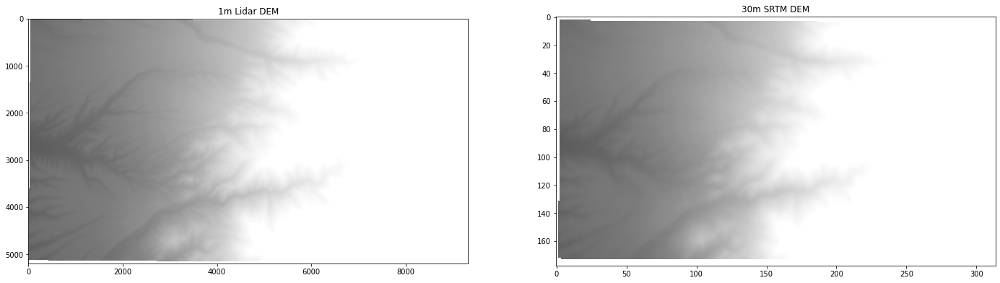

In [9]:
#plot our raster, which is a 1m lidar derived DEM from the San Luis Mountains
#We use vmin and vmax to set the minimum and maximum values of the colorramp applied to the DEM plot. Feel free to vary these!

fig=plt.figure(figsize=(24,16))

ax1 = fig.add_subplot(1, 2, 1)
ax1.set_title('1m Lidar DEM')
plt.imshow(dem1_hrt_im, cmap='Greys_r', vmin=2000, vmax=3000)

ax2 = fig.add_subplot(1, 2, 2)
ax2.set_title('30m SRTM DEM')
plt.imshow(srtm_utm_im, cmap='Greys_r', vmin=2000, vmax=3000)

Earthpy allows for easy plotting of raster band histograms from DEMs and remote sensing imagery. Here we visualize the elevation distribution from our two datasets.

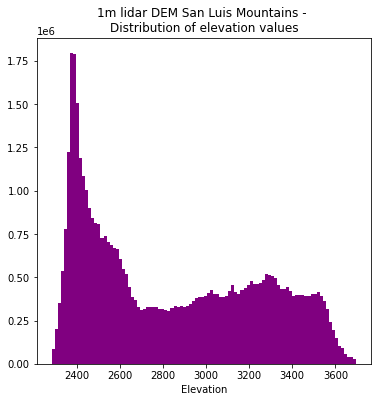

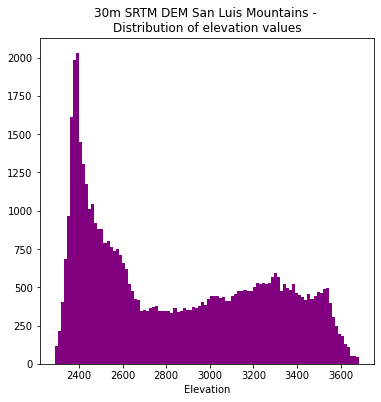

In [10]:
#Lets take a peek at the distribution of elevation values within this domain
#Note that we are using the masked numpy arrays to create these
ep.hist(dem1_hrt_im[~dem1_hrt_im.mask].ravel(),
        bins=100, figsize=(6,6), xlabel='Elevation',
        title="1m lidar DEM San Luis Mountains - \nDistribution of elevation values")

ep.hist(srtm_utm_im[~srtm_utm_im.mask].ravel(),
        bins=100, figsize=(6,6), xlabel='Elevation',
        title="30m SRTM DEM San Luis Mountains - \nDistribution of elevation values")
plt.show()

Wow! Despite the difference in acquisition technology and number of cells in each raster the overall shape of the distribution is nearly identical. SRTM appears to do a pretty good job in this sort of mountainous, arid environment of accurately capturing the gross landscape structure. 

We will see in later steps where high-resolution topographic methods really shine.


## Raster calculations and terrain visualization

We saw in the above steps that the raw DEMs visually appear pretty drab, and in addition the overall elevation distribution between our datasets appears pretty similar. 

Now we will begin using Whitebox Tools to quickly and easily create better visualizations of our data that allow for improved characterization of our study area and more quantitative metrics of our landscape.

![NEON Hillshade](http://www.geography.hunter.cuny.edu/~jochen/GTECH361/lectures/lecture11/concepts/Hillshade_files/image001.gif)

> Image courtesy of NEON, Jochen Albrecht.




We start by creating a simple hillshade from each of our lidar and SRTM rasters, this time using the geoTIFF files rather than the numpy arrays. Whitebox tools uses .tif files as inputs and outputs, but we still read the resulting geoTIFFs back into arrays for better plotting.

In [11]:
#Set our data directory to our new cloned Git and where we placed the DEM
data_dir = '/content/csdms-clinic-2020/data/sanluis/'

#set whitebox working directory
wbt.set_working_dir(data_dir)

#Create a hillshade to better visualize our lidar DEM
wbt.hillshade("dem1_hrt.tif", "dem1_hrt_315_30.tif", 315, 30)

#Read lidar hillshade tiff to array for easier plotting
hillshade_hrt = imageio.imread(os.path.join(data_dir, 'dem1_hrt_315_30.tif'))

#Create a hillshade to better visualize our SRTM DEM
wbt.hillshade("srtm30_utm.tif", "srtm_utm_315_30.tif", 315, 30)

#Read SRTM hillshade tiff to array for easier plotting
hillshade_srtm_hrt = imageio.imread(os.path.join(data_dir, 'srtm_utm_315_30.tif'))

print(os.listdir(data_dir))

['dem1_hrt.tif', 'dem30_hrt.tif', 'srtm30_utm_small.tif', 'srtm30_utm.tif', 'srtm_dem.tif', 'ObservationPoints.csv', 'dem1_hrt_315_30.tif', 'readme.md', 'extent.csv', 'channel.csv', 'dem1_sl.tif', 'srtm_utm_315_30.tif', 'dem1.asc']


Now that we've calculated our hillshade rasters, let's vizualise them!

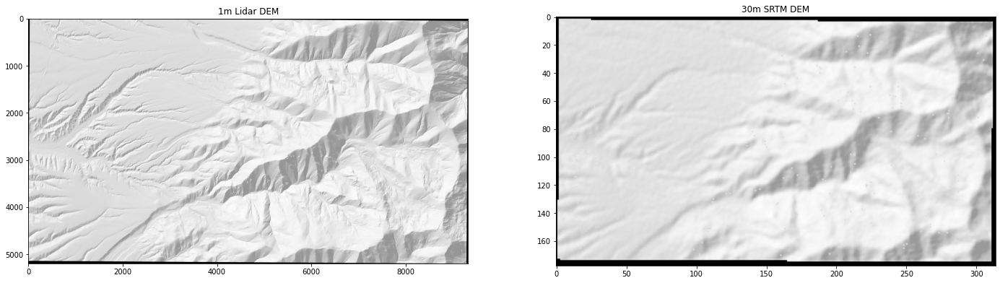

In [12]:
fig=plt.figure(figsize=(24,16))

ax1 = fig.add_subplot(1, 2, 1)
ax1.set_title('1m Lidar DEM')
plt.imshow(hillshade_hrt, cmap='Greys_r')

ax2 = fig.add_subplot(1, 2, 2)
ax2.set_title('30m SRTM DEM')
plt.imshow(hillshade_srtm_hrt, cmap='Greys_r')

Now we can start seeing a pretty big difference, despite our initial analysis showing how the overall landscape structure is similar. Our lidar DEM is capturing a lot more fine-scale variation, as you would expect given the raster cell size is 1/900th of the SRTM data.

### Zooming in on our study area

We can better appreciate these small scale variations by zooming in on the uppermost reaches of one of the catchments. 

![alt text](https://drive.google.com/uc?id=1_Wxqc_o4r_NrolNrIeWpT4tFfpTziYY3)

## Subsetting the data for future analysis

From here on we will be looking at a smaller region of this initial DEM to allow for more efficient computation. The codes we run from Whitebox Tools are very efficient, but multiple operations can quickly eat up what little RAM Google Co-Lab generously provides us with.

Lets plot our overall 1m lidar DEM and place an overlay of where we will be focusing for the rest of the clinic



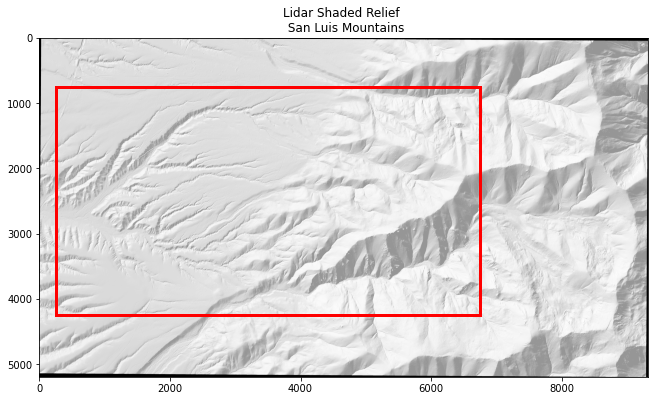

In [13]:
#Plot our 1m DEM hillshade with our subset region
import matplotlib.patches as patches

fig=plt.figure(figsize=(24,16))

ax1 = fig.add_subplot(1, 2, 1)
ax1.set_title(("Lidar Shaded Relief \n San Luis Mountains"))

ax1.imshow(hillshade_hrt, cmap='Greys_r')

# Create a Rectangle patch
rect = patches.Rectangle((250,750),6500,3500,linewidth=3,edgecolor='r',facecolor='none')

# Add the patch to the Axes
ax1.add_patch(rect)

plt.show()

Lets create hillshades of the lidar and SRTM data for this subregion, and take a look

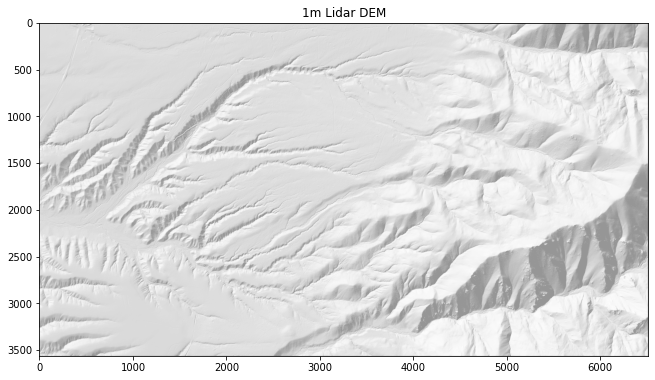

In [14]:
#Create a hillshade to better visualize our DEM
wbt.hillshade("dem1_sl.tif", "dem1_sl_315_30.tif", 315, 30)

#Read hillshade tiff to array for easier plotting
hillshade_sl = imageio.imread(os.path.join(data_dir, 'dem1_sl_315_30.tif'))

#Create a hillshade to better visualize our DEM
wbt.hillshade("srtm30_utm_small.tif", "srtm30_utm_small_315_30.tif", 315, 30)

#Read hillshade tiff to array for easier plotting
hillshade_srtm = imageio.imread(os.path.join(data_dir, 'srtm30_utm_small_315_30.tif'))

fig=plt.figure(figsize=(24,16))

ax1 = fig.add_subplot(1, 2, 1)
ax1.set_title('1m Lidar DEM')
plt.imshow(hillshade_sl, cmap='Greys_r')

We see that within this smaller area there's still a lot of cool stuff! We have captured the entirety of a small drainage catchment, and can see interesting changes in morphology as we move from west to east, leaving the alluvial valley and entering the more rugged San Luis mountains

## Raster manipulation and math: detrending a DEM and DEM derivatives
We saw more qualitative detail of our region looking at a hillshade visualization rather than the base DEM, but there is a lot more we can do in terms of quantitative analysis, visualization, and raster algebra. 

One powerful technique for enhancing the relative relief of a topographic surface is the creation of a detrended DEM. This technique relies on the creation of a trend surface created by fitting a plane to some sampling of the original DEM, and then subtracting this surface. The resulting residual topography can help understand the occurence and structure of small-scale features that may be masked by larger gradients, as well as emphasize the relative relief or ruggedness of the landscape.

![ArcGIS Trend Surface](https://resources.arcgis.com/en/help/main/10.2/009z/GUID-BD7D08A4-474E-47F8-A444-D7C8766E63A0-web.gif)


> Image courtesy of ArcGIS Resources

We will create a second order polynomial surface (with zero being a flat plane) from our 1m lidar DEM





In [15]:
#The hillshade shows us the beautiful channel structure of this basin: lets see if we can emphasise it further by detrending the DEM by a polynomial
#Read subset in as array
original = imageio.imread(os.path.join(data_dir, 'dem1_sl.tif'))

#Create second order polynomial trend surface
wbt.trend_surface("dem1_sl.tif", "dem1_sl_trend_2.tif", order=2)

#Read trend surface .tif into array
trend_surface = imageio.imread(os.path.join(data_dir, 'dem1_sl_trend_2.tif'))



tcmalloc: large alloc 1113260032 bytes == 0x55a34d810000 @  0x7fb97b5a7001 0x55a31ecf8a77 0x55a31e69c512 0x55a31f0ce7d9 0x55a31f0cbdaf 0x55a31edbb183 0x55a31f1a2803 0x55a31f1ab35a 0x55a31f1a3250 0x55a31f0cf8f2 0x7fb97a95fb97 0x55a31e504d6a


Next, we subtract this surface from our original DEM

In [0]:
#Subtract trend surface from DEM
wbt.subtract("dem1_sl.tif", "dem1_sl_trend_2.tif", "detrended_dem1_sl.tif")

#Read detrended DEM into array
detrended = imageio.imread(os.path.join(data_dir, 'detrended_dem1_sl.tif'))

Finally, we plot our original DEM, the hillshade, the trend surface, and the resulting detrended DEM to see what we can observe

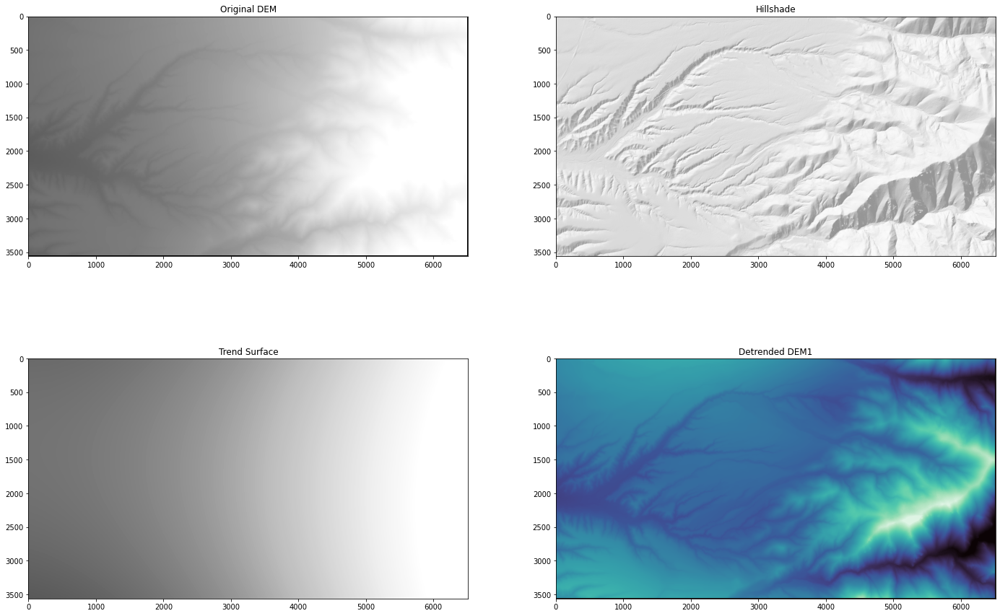

In [17]:
#Lets see how the detrended DEM compares to the original and the hillshade
fig=plt.figure(figsize=(24,16))

ax1 = fig.add_subplot(2, 2, 1)
ax1.set_title('Original DEM')
plt.imshow(original, cmap='Greys_r', vmin=2000, vmax=3000)

ax2 = fig.add_subplot(2, 2, 2)
ax2.set_title('Hillshade')
plt.imshow(hillshade_sl, cmap='Greys_r')

ax3 = fig.add_subplot(2, 2, 3)
ax3.set_title('Trend Surface')
plt.imshow(trend_surface,cmap='Greys_r', vmin=2000, vmax=3000)

ax4 = fig.add_subplot(2, 2, 4)
ax4.set_title('Detrended DEM1')
plt.imshow(detrended,cmap='mako', vmin=-200, vmax=200)

plt.show()

We see that the eastern half of the catchment has significantly more residual topography, with steeper slopes and valleys. This corresponds with leaving the alluvial valley and entering the mountains.

Calculated landscape attributes such as slope, curvature, and aspect can be helpful for both visualizing and quantifying geomorphic characteristics and surface processes domains. With Whitebox we can create these derivative products quickly. Rasters such as these can provide the necessary inputs for operations such as automated feature extraction and channel delineation.



In [0]:
#Calculate slope from original raster
wbt.slope("dem1_sl.tif", "dem1_sl_slope.tif")

#Calculate curvature from original raster
wbt.total_curvature("dem1_sl.tif", "dem1_sl_totcurve.tif")

#Calculate aspect from original raster
wbt.aspect("dem1_sl.tif", "dem1_sl_aspect.tif")

#read slope into array
slope = imageio.imread(os.path.join(data_dir, 'dem1_sl_slope.tif'))

#read curvature into array
curvature = imageio.imread(os.path.join(data_dir, 'dem1_sl_totcurve.tif'))

#read aspect into array
aspect = imageio.imread(os.path.join(data_dir, 'dem1_sl_aspect.tif'))

Plot the lidar hillshade, aspect, slope, and curvature

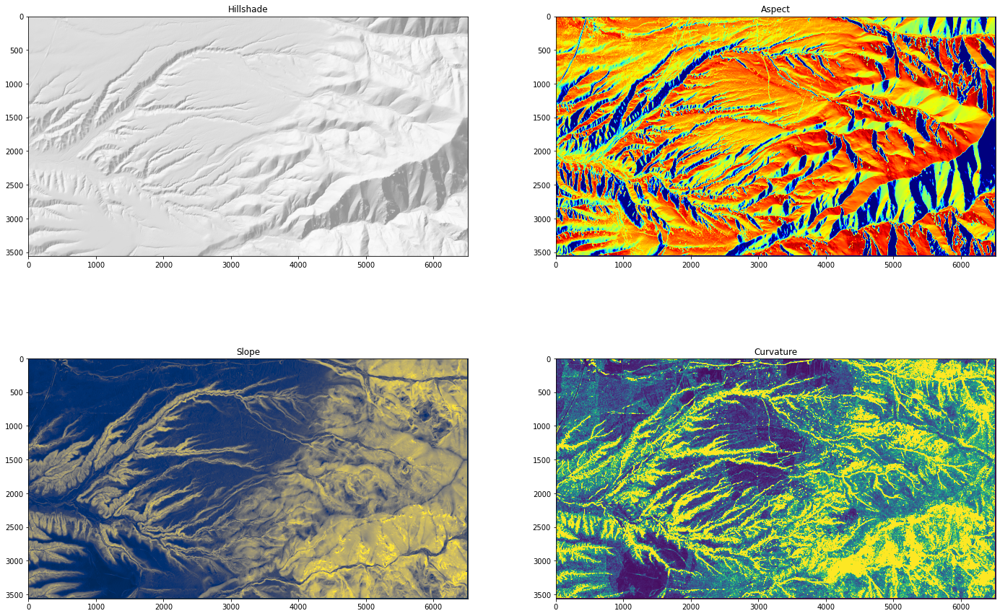

In [19]:
#
fig=plt.figure(figsize=(24,16))

ax1 = fig.add_subplot(2, 2, 1)
ax1.set_title('Hillshade')
plt.imshow(hillshade_sl, cmap='Greys_r')

ax2 = fig.add_subplot(2, 2, 2)
ax2.set_title('Aspect')
plt.imshow(aspect, vmin=0, vmax=360, cmap='jet')

ax3 = fig.add_subplot(2, 2, 3)
ax3.set_title('Slope')
plt.imshow(slope, vmin= 0, vmax = 45, cmap='cividis')

ax4 = fig.add_subplot(2, 2, 4)
ax4.set_title('Curvature')
plt.imshow(curvature, vmin=0, vmax=180)

plt.show()

Let's now run the same calculations on our original SRTM dataset and see how they compare

In [0]:
#Calculate slope from original raster
wbt.slope("srtm30_utm_small.tif", "srtm30_slope.tif")

#Calculate curvature from original raster
wbt.total_curvature("srtm30_utm_small.tif", "srtm30_totcurve.tif")

#Calculate aspect from original raster
wbt.aspect("srtm30_utm_small.tif", "srtm30_aspect.tif")

#read slope into array
srtm_slope = imageio.imread(os.path.join(data_dir, 'srtm30_slope.tif'))

#read curvature into array
srtm_curvature = imageio.imread(os.path.join(data_dir, 'srtm30_totcurve.tif'))

#read aspect into array
srtm_aspect = imageio.imread(os.path.join(data_dir, 'srtm30_aspect.tif'))

Plot the SRTM hillshade, aspect, slope, and curvature

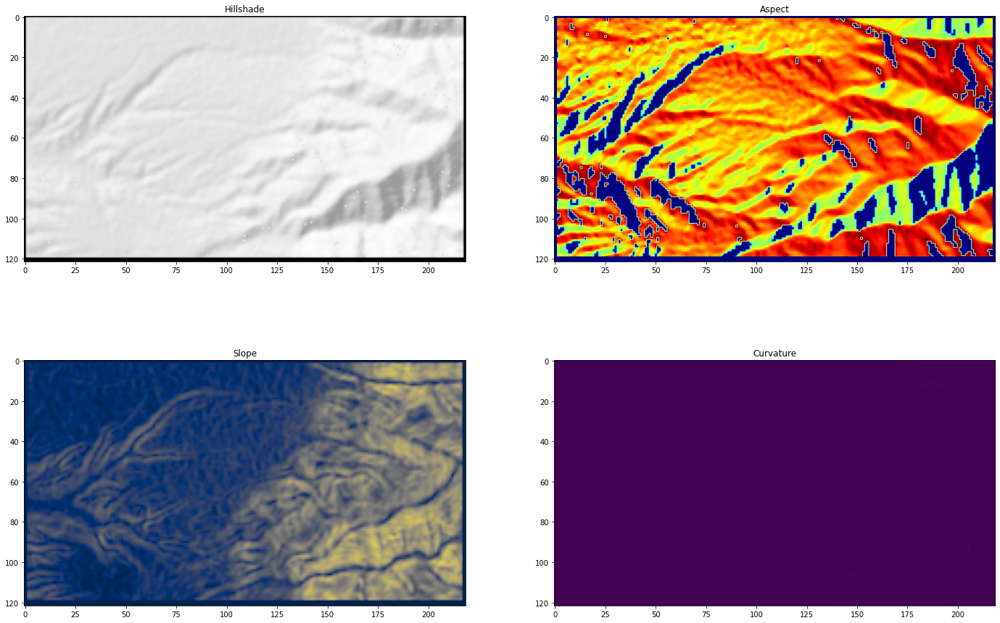

In [21]:
fig=plt.figure(figsize=(24,16))

ax1 = fig.add_subplot(2, 2, 1)
ax1.set_title('Hillshade')
plt.imshow(hillshade_srtm, cmap='Greys_r')

ax2 = fig.add_subplot(2, 2, 2)
ax2.set_title('Aspect')
plt.imshow(srtm_aspect, vmin=0, vmax=360, cmap='jet')

ax3 = fig.add_subplot(2, 2, 3)
ax3.set_title('Slope')
plt.imshow(srtm_slope, vmin= 0, vmax = 45, cmap='cividis')

ax4 = fig.add_subplot(2, 2, 4)
ax4.set_title('Curvature')
plt.imshow(srtm_curvature, vmin=0, vmax=180)

plt.show()

Lets compare slope and aspect from lidar and SRTM side by side

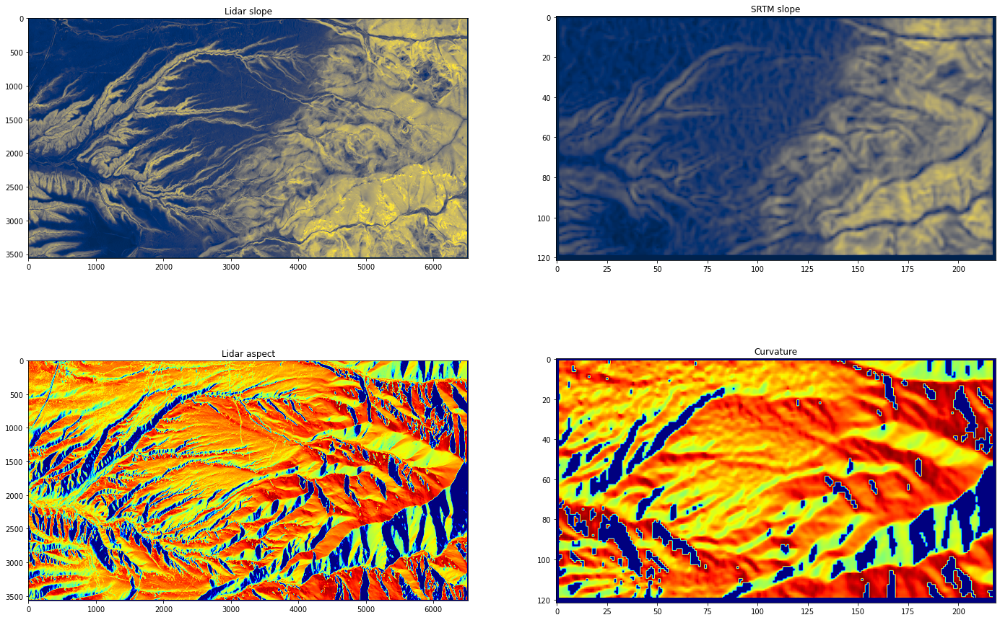

In [22]:
fig=plt.figure(figsize=(24,16))

ax1 = fig.add_subplot(2, 2, 1)
ax1.set_title('Lidar slope')
plt.imshow(slope, vmin= 0, vmax = 45, cmap='cividis')

ax2 = fig.add_subplot(2, 2, 2)
ax2.set_title('SRTM slope')
plt.imshow(srtm_slope, vmin= 0, vmax = 45, cmap='cividis')

ax3 = fig.add_subplot(2, 2, 3)
ax3.set_title('Lidar aspect')
plt.imshow(aspect, vmin= 0, vmax = 360, cmap='jet')

ax4 = fig.add_subplot(2, 2, 4)
ax4.set_title('Curvature')
plt.imshow(srtm_aspect, vmin= 0, vmax = 360, cmap='jet')

plt.show()

This is a huge difference! Note that the lidar dataset contains significantly more information about the hillslopes and channels. Lets look in some more detail by plotting the distributions.

As before, we first open our 1m DEM slope raster into a numpy array to mask nodata values

In [23]:
# 1) Open our 1m DEM slope raster
#Open a geoTIFF using rasterio and convert to an array array
with rio.open('/content/csdms-clinic-2020/data/sanluis/dem1_sl_slope.tif') as src:
    # Convert / read the data into a numpy array
    # masked = True turns `nodata` values to nan. 
    dem1_slope_im = src.read(1, masked=True)
    
    # Create a spatial extent object using rio.plot.plotting
    spatial_extent = rio.plot.plotting_extent(src)

print("object shape:", dem1_slope_im.shape)
print("object type:", type(dem1_hrt_im))

with rio.open('/content/csdms-clinic-2020/data/sanluis/dem1_sl_slope.tif') as src:
    
    # Convert / read the data into a numpy array:
    dem1_slope_2 = src.read(1)

with rio.open('/content/csdms-clinic-2020/data/sanluis/dem1_sl_slope.tif') as src:
    
    # Convert / read the data into a numpy array:
    dem1_slope_3 = src.read()

print("Array Shape Using read(1):", dem1_slope_2.shape)

# Notice that without the (1), your numpy array has a third dimension
print("Array Shape Using read():", dem1_slope_3.shape)


object shape: (3562, 6514)
object type: <class 'numpy.ma.core.MaskedArray'>
Array Shape Using read(1): (3562, 6514)
Array Shape Using read(): (1, 3562, 6514)


We similarly mask the SRTM slope raster

In [24]:
# 2) Open our 30m SRTM slope raster
#Open a geoTIFF using rasterio and convert to an array array
with rio.open('/content/csdms-clinic-2020/data/sanluis/srtm30_slope.tif') as src:
    # Convert / read the data into a numpy array
    # masked = True turns `nodata` values to nan
    srtm_slope_im = src.read(1, masked=True)
    
    # Create a spatial extent object using rio.plot.plotting
    spatial_extent = rio.plot.plotting_extent(src)

print("object shape:", srtm_slope_im.shape)
print("object type:", type(srtm_slope_im))

with rio.open('/content/csdms-clinic-2020/data/sanluis/srtm30_slope.tif') as src:
    
    # Convert / read the data into a numpy array:
    srtm_slope_2 = src.read(1)

with rio.open('/content/csdms-clinic-2020/data/sanluis/srtm30_slope.tif') as src:
    
    # Convert / read the data into a numpy array:
    srtm_slope_3 = src.read()

print("Array Shape Using read(1):", srtm_slope_2.shape)

# Notice that without the (1), your numpy array has a third dimension
print("Array Shape Using read():", srtm_slope_3.shape)


object shape: (122, 219)
object type: <class 'numpy.ma.core.MaskedArray'>
Array Shape Using read(1): (122, 219)
Array Shape Using read(): (1, 122, 219)


Finally, we can plot the slope distributions of both datasets. 

Recall that the elevation histograms for lidar and SRTM were almost identical.

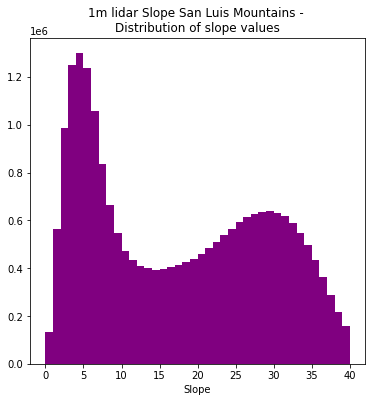

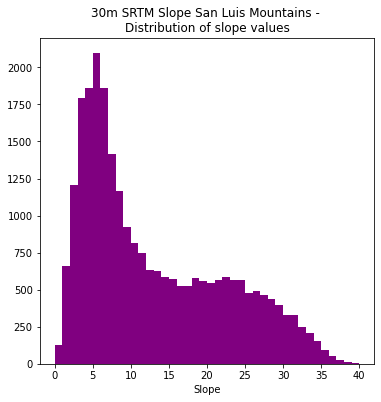

In [25]:
#Lets take a peek at the distribution of elevation values within this domain
#Note that we are using the masked numpy arrays to create these
ep.hist(dem1_slope_im[~dem1_slope_im.mask].ravel(),
        bins=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10,11, 12,13, 14,15, 16,17, 18,19, 20,21, 22,23, 24,25, 26,27, 28,29, 30,31, 32,33, 34,35, 36,37, 38,39, 40], figsize=(6,6), xlabel='Slope',
        title="1m lidar Slope San Luis Mountains - \nDistribution of slope values")

ep.hist(srtm_slope_im[~srtm_slope_im.mask].ravel(),
        bins=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10,11, 12,13, 14,15, 16,17, 18,19, 20,21, 22,23, 24,25, 26,27, 28,29, 30,31, 32,33, 34,35, 36,37, 38,39, 40], figsize=(6,6), xlabel='Slope',
        title="30m SRTM Slope San Luis Mountains - \nDistribution of slope values")
plt.show()

Wow! Compared to how similar the elevation distributions were this is striking. The SRTM data has completely failed to sample the second peak at ~30 degrees. This has major implications for characterization of hillslope and channel processes, and would give you an inaccurate read on the scale and density of landscape connectivity.

Let's take a break from Co-lab and head back over to the presentation before diving in to channel network analysis.

# Channel network analysis
Lets now take a look at some of the common channel network delineation workflows and how they compare across topographic datasets and with curvature based methods.

## Steepest descent flow accumulation routing
This is by far the most common workflow and methodology, and is commonly packaged with GIS programs such as ArcGIS.

This workflow relies on calculating and propagating the number of cells upstream of a cell that flow into into it given a calculated flow direction derived from a hydrologically conditioned DEM. 

![ArcGIS watershed image](https://pro.arcgis.com/en/pro-app/tool-reference/spatial-analyst/GUID-69F18992-8563-4EEA-A3C0-28A07EBB162D-web.png)

1.   Calculate flow direction
![ArcGIS flow direction](https://pro.arcgis.com/en/pro-app/tool-reference/spatial-analyst/GUID-A541AFD3-922C-41DA-952C-0D4524F85B39-web.gif)

2. Calculate flow accumulation
![ArcGIS flow accumulation](https://pro.arcgis.com/en/pro-app/tool-reference/spatial-analyst/GUID-AD2E1C64-88F8-4DF1-86A4-A6EAFB8DDD3E-web.png)

3.   Create stream networks, orders, and watersheds

## Flow direction routing

Basic flow routing is accomplished using the D8 algorithm, but other methods exist. In particular the D-Infinity algorithm usually provides a more accurate representation of flow, especially when used with high-resolution topography

![Tesfa et al., 2011](https://i.stack.imgur.com/RDvcY.png)

Lets experiment with some of these routines using the power of Whitebox Tools and compare our high-resolution data to the SRTM data.

We first will create our "breached" DEM and then calculate flow accumulation using both D8 and D-Inf



In [0]:
#First we calculate our smoothed raster, our depression filled raster, and then flow accumulation
#We will calculate both Dinf and D8 flow accumulation
wbt.feature_preserving_smoothing("dem1_sl.tif", "lidar_smoothed.tif", filter=3)
wbt.breach_depressions("lidar_smoothed.tif", "lidar_breached.tif")
wbt.d_inf_flow_accumulation("lidar_breached.tif", "lidar_flow_accum.tif", out_type='cells')
wbt.d8_flow_accumulation("lidar_breached.tif", "lidar_flow_accum_d8.tif", out_type='catchment area')

#Read the resulting lidar tiffs into arrays for easier plotting
lidar_dem = imageio.imread(os.path.join(data_dir, 'dem1_sl.tif'))
lidar_smoothed = imageio.imread(os.path.join(data_dir, 'lidar_smoothed.tif'))
lidar_breached = imageio.imread(os.path.join(data_dir, 'lidar_breached.tif'))
lidar_flow_accum = imageio.imread(os.path.join(data_dir, 'lidar_flow_accum.tif'))
lidar_flow_accum_d8 = imageio.imread(os.path.join(data_dir, 'lidar_flow_accum_d8.tif'))

Do the same for the SRTM dataset

In [0]:
#Next we calculate our smoothed raster, our depression filled raster, and then flow accumulation for the SRTM DEM
#We will calculate both Dinf and D8 flow accumulation
wbt.feature_preserving_smoothing("srtm30_utm_small.tif", "srtm_smoothed.tif", filter=3)
wbt.breach_depressions("srtm_smoothed.tif", "srtm_breached.tif")
wbt.d_inf_flow_accumulation("srtm_breached.tif", "srtm_flow_accum.tif", out_type='ca')
wbt.d8_flow_accumulation("srtm_breached.tif", "srtm_flow_accum_d8.tif", out_type='catchment area')

#Read the resulting SRTM tiffs into arrays for easier plotting
srtm_dem = imageio.imread(os.path.join(data_dir, 'srtm30_utm_small.tif'))
srtm_smoothed = imageio.imread(os.path.join(data_dir, 'srtm_smoothed.tif'))
srtm_breached = imageio.imread(os.path.join(data_dir, 'srtm_breached.tif'))
srtm_flow_accum = imageio.imread(os.path.join(data_dir, 'srtm_flow_accum.tif'))
srtm_flow_accum_d8 = imageio.imread(os.path.join(data_dir, 'srtm_flow_accum_d8.tif'))

Lets first look at the D8 and Dinf results from our 1m lidar DEM

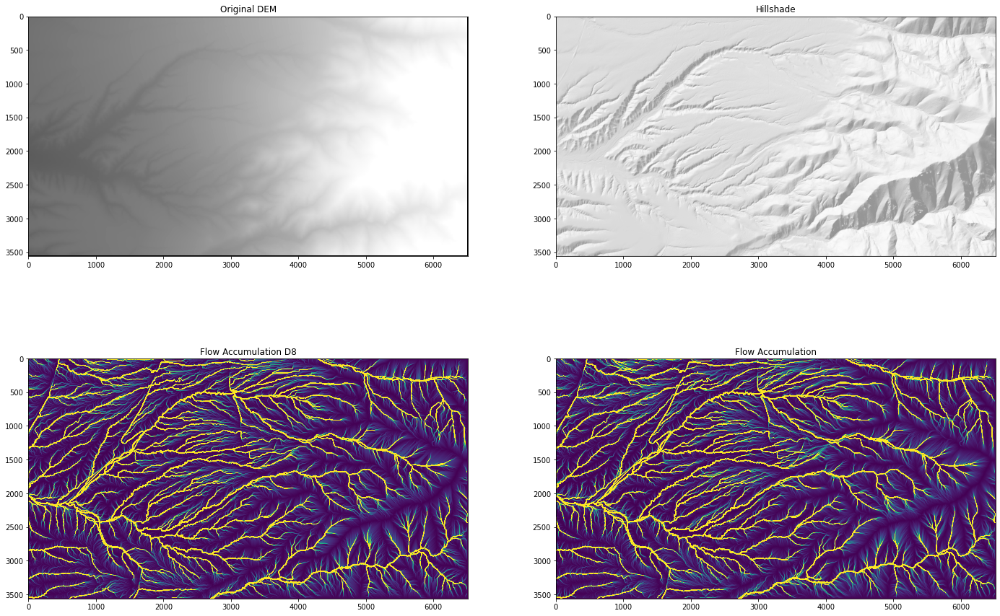

In [28]:
#Lets take a look!
fig=plt.figure(figsize=(24,16))

ax1 = fig.add_subplot(2, 2, 1)
ax1.set_title('Original DEM')
plt.imshow(lidar_dem, vmin=2000, vmax=3000, cmap='Greys_r')

ax2 = fig.add_subplot(2, 2, 2)
ax2.set_title('Hillshade')
plt.imshow(hillshade_sl, cmap = 'Greys_r')

ax3 = fig.add_subplot(2, 2, 3)
ax3.set_title('Flow Accumulation D8')
plt.imshow(lidar_flow_accum_d8, vmin=0, vmax=1000)

ax4 = fig.add_subplot(2, 2, 4)
ax4.set_title('Flow Accumulation')
plt.imshow(lidar_flow_accum, vmin=0, vmax=1000)

plt.show()

Now the same plots but for our SRTM dataset

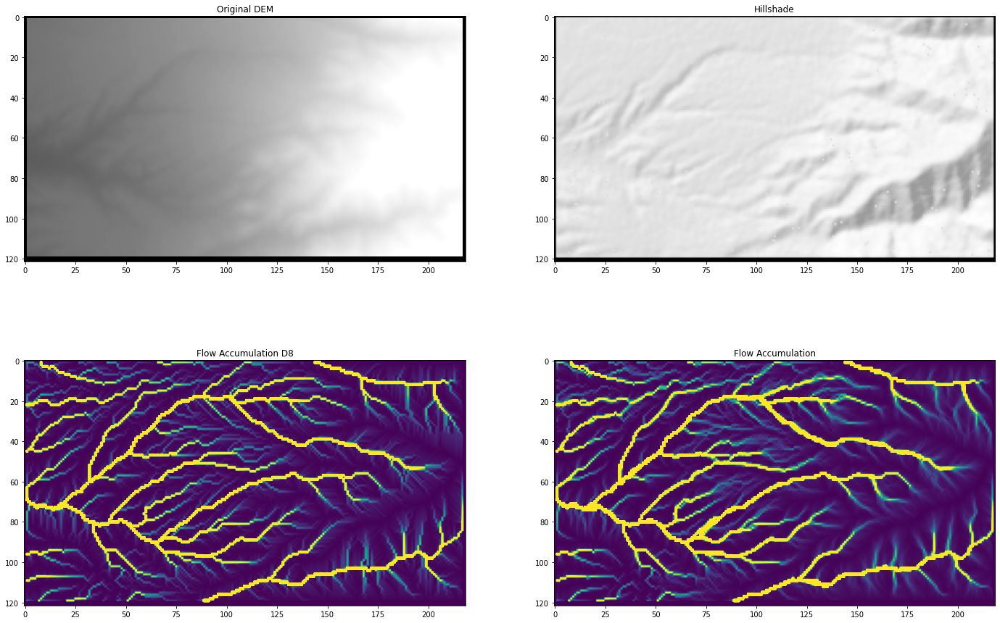

In [29]:
#Lets take a look!
fig=plt.figure(figsize=(24,16))

ax1 = fig.add_subplot(2, 2, 1)
ax1.set_title('Original DEM')
plt.imshow(srtm_dem, vmin=2000, vmax=3000, cmap='Greys_r')

ax2 = fig.add_subplot(2, 2, 2)
ax2.set_title('Hillshade')
plt.imshow(hillshade_srtm, cmap = 'Greys_r')

ax3 = fig.add_subplot(2, 2, 3)
ax3.set_title('Flow Accumulation D8')
plt.imshow(srtm_flow_accum_d8, vmin=0, vmax=100000)

ax4 = fig.add_subplot(2, 2, 4)
ax4.set_title('Flow Accumulation')
plt.imshow(srtm_flow_accum, vmin=0, vmax=100000)

plt.show()

Let's compare the Lidar and SRTM flow accumulations side by side.

Here we see the significant differences between the high and low resolution datasets, which should be no surprise by now!

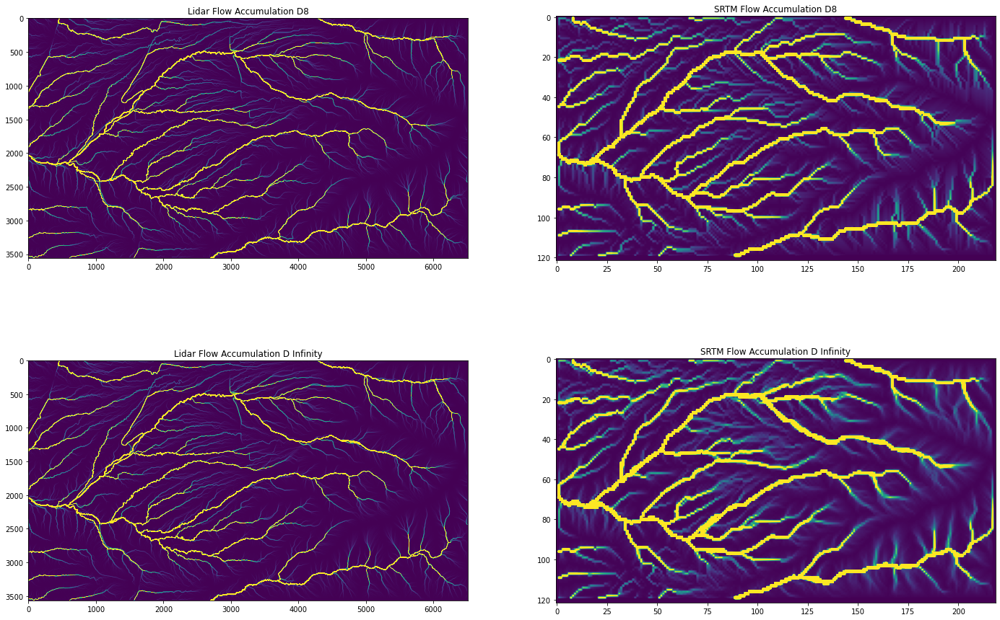

In [31]:
#Lets take a look!
fig=plt.figure(figsize=(24,16))

ax1 = fig.add_subplot(2, 2, 1)
ax1.set_title('Lidar Flow Accumulation D8')
plt.imshow(lidar_flow_accum_d8, vmin=0, vmax = 10000)

ax2 = fig.add_subplot(2, 2, 2)
ax2.set_title('SRTM Flow Accumulation D8')
plt.imshow(srtm_flow_accum_d8, vmin=0, vmax = 100000)

ax3 = fig.add_subplot(2, 2, 3)
ax3.set_title('Lidar Flow Accumulation D Infinity')
plt.imshow(lidar_flow_accum, vmin=0, vmax=10000)

ax4 = fig.add_subplot(2, 2, 4)
ax4.set_title('SRTM Flow Accumulation D Infinity')
plt.imshow(srtm_flow_accum, vmin=0, vmax=100000)

plt.show()

## Channel network delineation and comparison

Using our flow accumulation rasters we can now create rasters corresponding to the landscapes channel network by definining a flow accumulation threshold.

In this case we will use 1000 cells, or roughly 50 square meters.


In [41]:
#First we extract all cells that correspond with a given accumulation threshold and save them to a new stream raster
wbt.extract_streams("lidar_flow_accum.tif", "lidar_streams_dinf_1k.tif", threshold=1000, zero_background=False)
wbt.extract_streams("lidar_flow_accum_d8.tif", "lidar_streams_d8_1k.tif", threshold=1000, zero_background=False)

#Similar but for SRTM
wbt.extract_streams("srtm_flow_accum.tif", "srtm_streams_dinf_10k.tif", threshold=10000, zero_background=False)

0

#### Lets now compare the results of the D-infinity and D-8 methods on the lidar data

NOTE- These results are a premade plot in the interests of time, but you can recreate them using the outputs we have generated above.

It appears that the D-infinity gives more "realistic" looking results, with less straight channel reaches.

Comparatively the D-8 results appear more linear with sharp, unnatural junctions.

Overall at this data resolution the results are fairly similar! Notice that with even this very low accumulation threshold we may still be missing some of the channel heads.

![Headwaters Channels](https://drive.google.com/uc?id=1k-P5ZF6BJCwZkvsBgustCDkA3wbc5rd2)


#### Here is the SRTM D-infinity on the SRTM DEM

Overall not too bad! There's almost no hope of channel head detection, however, and many of the important details are engulphed in the cell footprint

![Headwaters Channels](https://drive.google.com/uc?id=1VmXSA4cBJ36nDP3-4XSlsO48P5vklWEr)

## What about in the lower relief alluvial valley?

Similar to the headwaters the overall pattern of the D8 and Dinf networks are comparable, with d-inf perhaps providing a more realistic representation.

However, both are now encountering issues with anthropogenic features, namely roads. This is a common occurence in flatter landscapes and is a significant challenge to accurate channel network delineation with high-resolution datasets.

![Headwaters Channels](https://drive.google.com/uc?id=1kAnVFVAc69631H4AbZlGlz9X2tbBh0d7)

### This is where curvature and automated feature extraction can help!




## We can now begin to use our channel network!

Delineating an accurate channel network is only the first step to querying the landscape. As an example, we can now use our channel network to derive a very rough version of a Height Above Nearest Drainage (HAND) map. This is a technique used to help understand and predict patterns of flooding and inundation that requires a very accurate DEM and an accurate channel network. The HAND model involves the calculation of the height of the landscape above the elevation of the nearest stream cell.

Whitebox tools can calculate a rough version of this, but I include it to illustrate what we can begin doing!

In [43]:
#Calculate elevation above stream using only the major stems (100k cells)
wbt.elevation_above_stream("lidar_breached.tif", "lidar_streams_d8_100k.tif", "lidar_hand.tif")

0

In [0]:
#Read the resulting SRTM tiffs into arrays for easier plotting
lidar_streams = imageio.imread(os.path.join(data_dir, 'lidar_flow_accum_d8.tif'))
hand = imageio.imread(os.path.join(data_dir, 'lidar_hand.tif'))

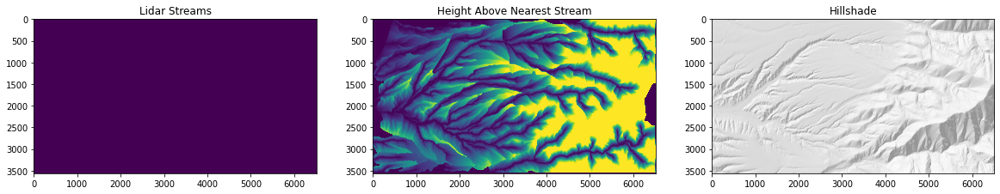

In [52]:
#Lets take a look!
fig=plt.figure(figsize=(20,24))

ax1 = fig.add_subplot(1, 3, 1)
ax1.set_title('Lidar Streams')
plt.imshow(lidar_streams, vmin=0, vmax = 1000)

ax2 = fig.add_subplot(1, 3, 2)
ax2.set_title('Height Above Nearest Stream')
plt.imshow(hand, vmin=0, vmax = 100)

ax3 = fig.add_subplot(1, 3, 3)
ax3.set_title('Hillshade')
plt.imshow(hillshade_sl, cmap = 'Greys_r')

## Comparison with GeoNet skeleton